In [10]:
import re
import matplotlib.pyplot as plt


In [11]:

# Open the file in read mode
with open("Friends_Transcript.txt", "r") as file:
    # Read the entire file content line by line
    lines = file.readlines()

# Initialize a list to store Chandler's dialogues with counts and intervening dialogues
chandler_dialogues = []

# Temporary list to hold dialogues between Chandler's lines
intervening_dialogues = []
# Counter for dialogues between Chandler's lines
dialogue_count = 0

# Iterate over each line in the file
for line in lines:
    # Check if the line starts with 'Chandler:'
    if line.startswith("Chandler:"):
        # Extract Chandler's dialogue
        dialogue = re.sub(r"Chandler:\s*", "", line).strip()
        
        # Store Chandler's dialogue, the count, and the intervening dialogues in the list
        chandler_dialogues.append({
            "chandler_dialogue": dialogue,
            "dialogues_since_last_chandler": dialogue_count,
            "intervening_dialogues": intervening_dialogues.copy()  # store a copy of the list
        })
        
        # Reset the dialogue count and intervening dialogues list after each Chandler line
        dialogue_count = 0
        intervening_dialogues.clear()
    else:
        # Check if the line resembles a dialogue line (e.g., "Name: Dialogue")
        match = re.match(r"(.+):\s*(.*)", line)
        if match:
            # Increment dialogue count and add the line to intervening dialogues
            dialogue_count += 1
            intervening_dialogues.append(line.strip())

# Print each of Chandler's lines along with the number, index, and content of intervening dialogues
for idx, entry in enumerate(chandler_dialogues, start=1):
    print(f"{idx}. Chandler: {entry['chandler_dialogue']} \n   Dialogues since last Chandler: {entry['dialogues_since_last_chandler']}")
    print("   Intervening dialogues:")
    for dialogue in entry['intervening_dialogues']:
        print(f"     {dialogue}")
    print("-" * 50)


1. Chandler: All right Joey, be nice. So does he have a hump? A hump and a hairpiece? 
   Dialogues since last Chandler: 4
   Intervening dialogues:
     Written by: Marta Kauffman & David Crane
     [Scene: Central Perk, Chandler, Joey, Phoebe, and Monica are there.]
     Monica: There's nothing to tell! He's just some guy I work with!
     Joey: C'mon, you're going out with the guy! There's gotta be something wrong with him!
--------------------------------------------------
2. Chandler: Sounds like a date to me. 
   Dialogues since last Chandler: 3
   Intervening dialogues:
     Phoebe: Wait, does he eat chalk?
     Phoebe: Just, 'cause, I don't want her to go through what I went through with Carl- oh!
     Monica: Okay, everybody relax. This is not even a date. It's just two people going out to dinner and- not having sex.
--------------------------------------------------
3. Chandler: Alright, so I'm back in high school, I'm standing in the middle of the cafeteria, and I realize I 

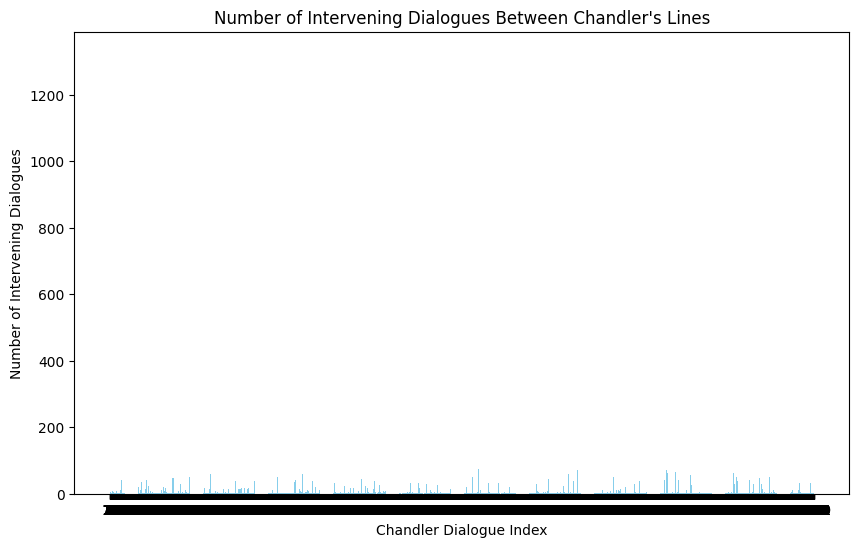

In [ ]:
# Prepare data for plotting
intervening_counts = [entry["dialogues_since_last_chandler"] for entry in chandler_dialogues]
chandler_indices = list(range(1, len(intervening_counts) + 1))  # Indices for each Chandler dialogue


In [ ]:

# Plotting the bar graph
plt.figure(figsize=(10, 6))
plt.bar(chandler_indices, intervening_counts, color='skyblue')
plt.xlabel("Chandler Dialogue Index")
plt.ylabel("Number of Intervening Dialogues")
plt.title("Number of Intervening Dialogues Between Chandler's Lines")
plt.xticks(chandler_indices)  # Set x-ticks to match each Chandler dialogue index
plt.show()

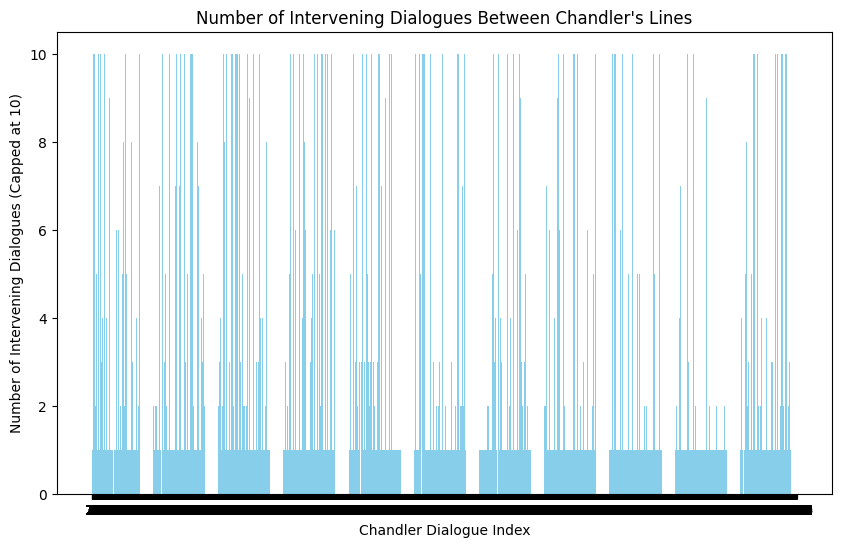

In [16]:
import re
import matplotlib.pyplot as plt

# Open the file in read mode
with open("Friends_Transcript.txt", "r") as file:
    # Read the entire file content line by line
    lines = file.readlines()

# Initialize a list to store Chandler's dialogues with counts and intervening dialogues
chandler_dialogues = []

# Temporary list to hold dialogues between Chandler's lines
intervening_dialogues = []
# Counter for dialogues between Chandler's lines, capped at 10
dialogue_count = 0

# Iterate over each line in the file
for line in lines:
    # Check if the line starts with 'Chandler:'
    if line.startswith("Chandler:"):
        # Extract Chandler's dialogue
        dialogue = re.sub(r"Chandler:\s*", "", line).strip()
        
        # Cap the intervening dialogues at the last 10 entries if needed
        capped_intervening_dialogues = intervening_dialogues[-10:]
        
        # Store Chandler's dialogue, the count, and the capped intervening dialogues in the list
        chandler_dialogues.append({
            "chandler_dialogue": dialogue,
            "dialogues_since_last_chandler": min(dialogue_count, 10),  # Cap count at 10
            "intervening_dialogues": capped_intervening_dialogues
        })
        
        # Reset the dialogue count and intervening dialogues list after each Chandler line
        dialogue_count = 0
        intervening_dialogues.clear()
    else:
        # Check if the line resembles a dialogue line (e.g., "Name: Dialogue")
        match = re.match(r"(.+):\s*(.*)", line)
        if match:
            # Increment dialogue count and add the line to intervening dialogues, but cap at 10
            dialogue_count += 1
            intervening_dialogues.append(line.strip())

# Prepare data for plotting
intervening_counts = [entry["dialogues_since_last_chandler"] for entry in chandler_dialogues]
chandler_indices = list(range(1, len(intervening_counts) + 1))  # Indices for each Chandler dialogue

# Plotting the bar graph
plt.figure(figsize=(10, 6))
plt.bar(chandler_indices, intervening_counts, color='skyblue')
plt.xlabel("Chandler Dialogue Index")
plt.ylabel("Number of Intervening Dialogues (Capped at 10)")
plt.title("Number of Intervening Dialogues Between Chandler's Lines")
plt.xticks(chandler_indices)  # Set x-ticks to match each Chandler dialogue index
plt.show()


In [17]:
# Print each of Chandler's lines along with the number, index, and content of intervening dialogues
for idx, entry in enumerate(chandler_dialogues, start=1):
    print(f"{idx}. Chandler: {entry['chandler_dialogue']} \n   Dialogues since last Chandler: {entry['dialogues_since_last_chandler']}")
    print("   Intervening dialogues:")
    for dialogue in entry['intervening_dialogues']:
        print(f"     {dialogue}")
    print("-" * 50)


1. Chandler: All right Joey, be nice. So does he have a hump? A hump and a hairpiece? 
   Dialogues since last Chandler: 4
   Intervening dialogues:
     Written by: Marta Kauffman & David Crane
     [Scene: Central Perk, Chandler, Joey, Phoebe, and Monica are there.]
     Monica: There's nothing to tell! He's just some guy I work with!
     Joey: C'mon, you're going out with the guy! There's gotta be something wrong with him!
--------------------------------------------------
2. Chandler: Sounds like a date to me. 
   Dialogues since last Chandler: 3
   Intervening dialogues:
     Phoebe: Wait, does he eat chalk?
     Phoebe: Just, 'cause, I don't want her to go through what I went through with Carl- oh!
     Monica: Okay, everybody relax. This is not even a date. It's just two people going out to dinner and- not having sex.
--------------------------------------------------
3. Chandler: Alright, so I'm back in high school, I'm standing in the middle of the cafeteria, and I realize I 

In [19]:
import pandas as pd

In [20]:
# Convert to a DataFrame
df = pd.DataFrame(chandler_dialogues)

# Export to CSV
df.to_csv("chandler_dialogues.csv", index=False)

In [21]:
df.shape

(7761, 3)